# SageNet

- **Creator**: Sebastian Birk (<sebastian.birk@helmholtz-munich.de>).
- **Affiliation:** Helmholtz Munich, Institute of Computational Biology (ICB), Talavera-López Lab
- **Date of Creation:** 10.01.2023
- **Date of Last Modification:** 14.01.2023

- The SageNet source code is available at https://github.com/MarioniLab/SageNet.
- The corresponding preprint is "Heidari, E. et al. Supervised spatial inference of dissociated single-cell data with SageNet. bioRxiv 2022.04.14.488419 (2022) doi:10.1101/2022.04.14.488419".

- Parts of the workflow of this notebook are inspired by the tutorial from https://scarches.readthedocs.io/en/latest/SageNet_mouse_embryo.html.
- The SageNet authors recommend log normalized counts as input. Therefore, we use log normalized counts (stored in adata.X).

## 1. Setup

### 1.1 Import Libraries

In [1]:
import copy
import os
import random
from datetime import datetime

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scarches as sca
import scanpy as sc
import squidpy as sq
import torch
import torch_geometric.data as geo_dt
from scarches.models.sagenet.utils import glasso

Global seed set to 0


### 1.2 Define Parameters

In [6]:
dataset = "seqfish_mouse_organogenesis_embryo2"
cell_type_key = "celltype_mapped_refined"
latent_key = "sagenet_latent"
leiden_resolution = 0.5 # used for Leiden clustering of latent space
random_seed = 0 # used for Leiden clustering

### 1.3 Run Notebook Setup

In [7]:
sc.set_figure_params(figsize=(6, 6))

In [8]:
# Get time of notebook execution for timestamping saved artifacts
now = datetime.now()
current_timestamp = now.strftime("%d%m%Y_%H%M%S")

In [9]:
# Use GPU if available
if torch.cuda.is_available():
  dev = "cuda:0"
else:
  dev = "cpu"
device = torch.device(dev)
print(device)

cuda:0


### 1.4 Configure Paths and Directories

In [13]:
data_folder_path = "../../datasets/srt_data/gold/"
figure_folder_path = f"../../figures/method_benchmarking/{dataset}/sagenet"

In [14]:
# Create required directories
os.makedirs(figure_folder_path, exist_ok=True)

## 2. Data

In [15]:
# Load data
adata = sc.read_h5ad(data_folder_path + f"{dataset}.h5ad")
adata_original = adata.copy()
adata.X = adata.X.toarray()

## 3. SageNet Model

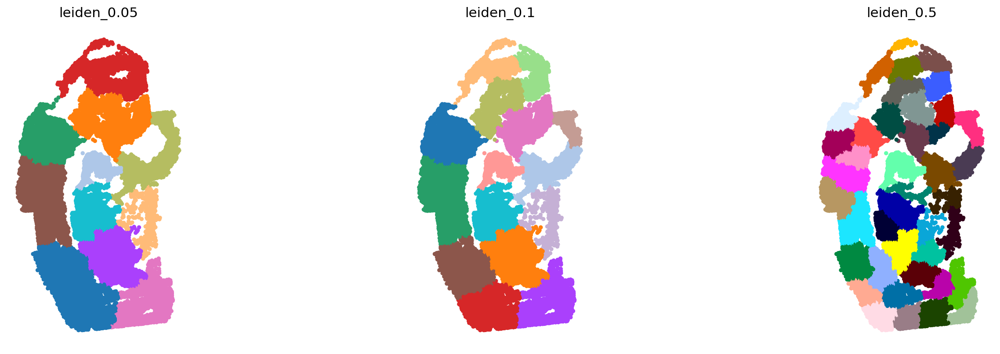

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


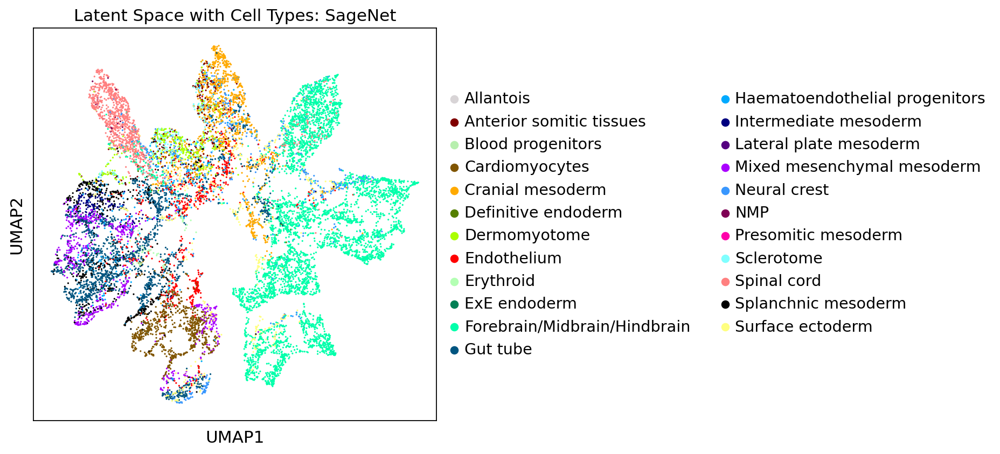

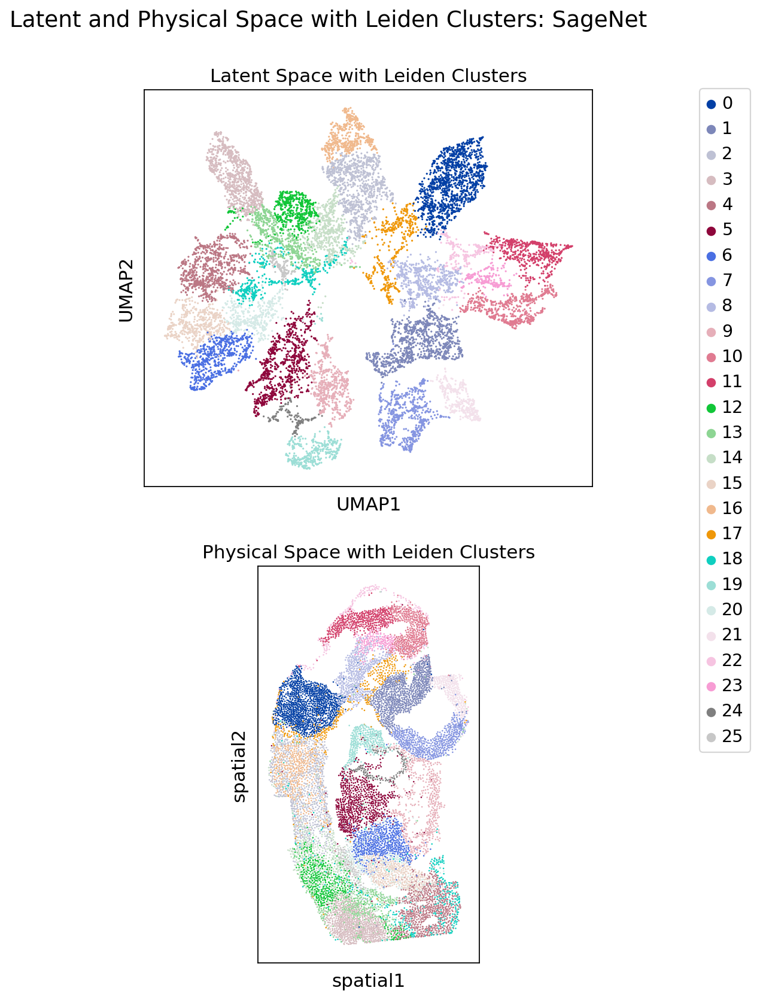

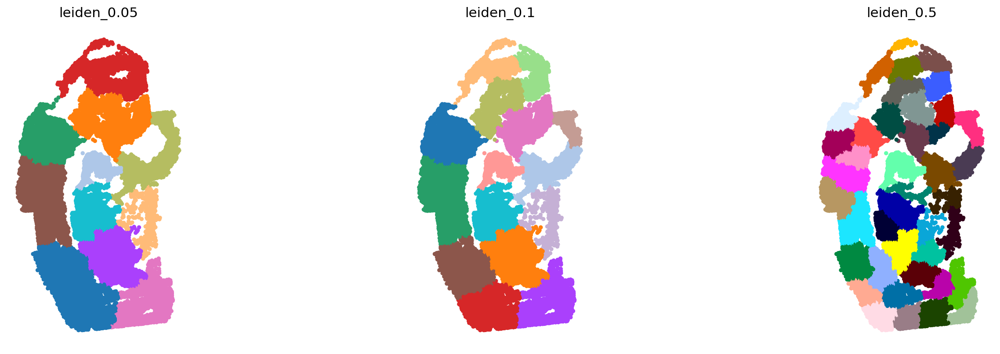

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


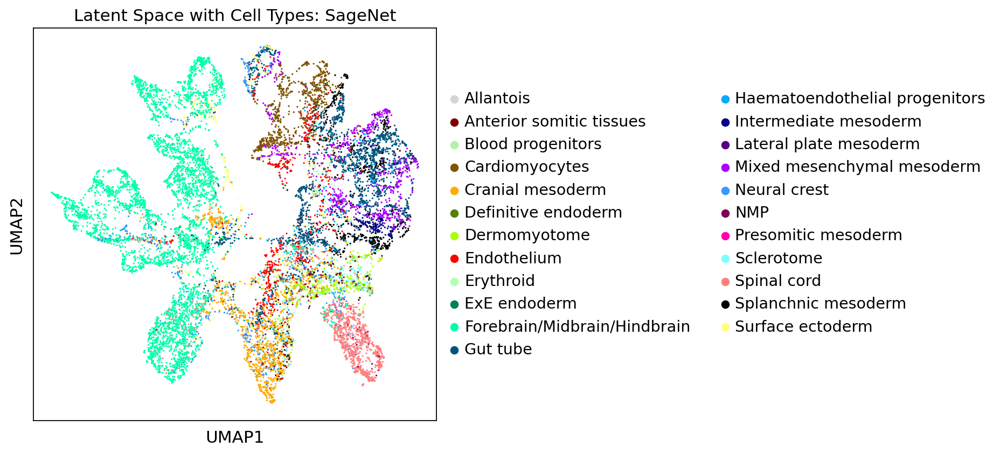

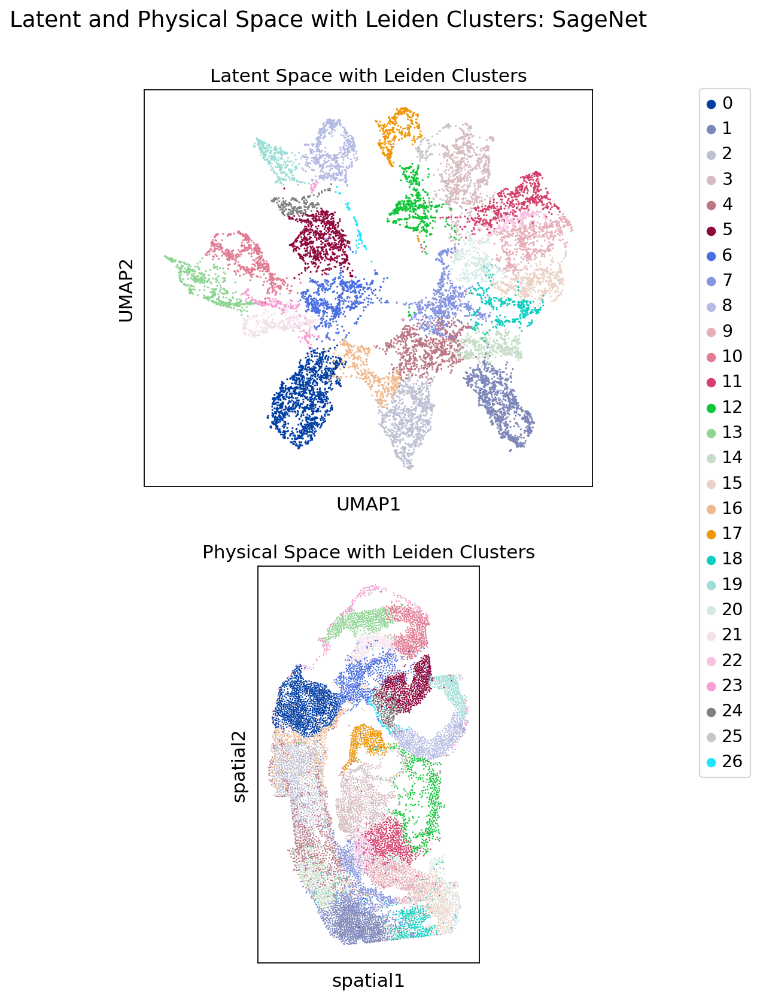

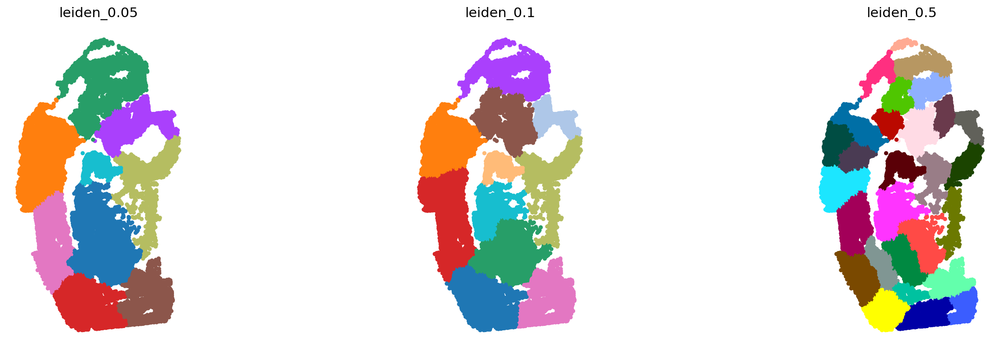

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


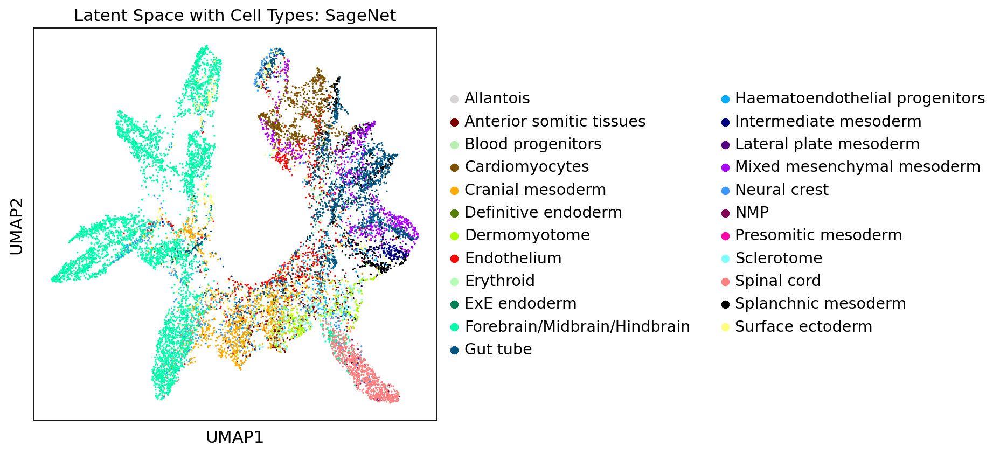

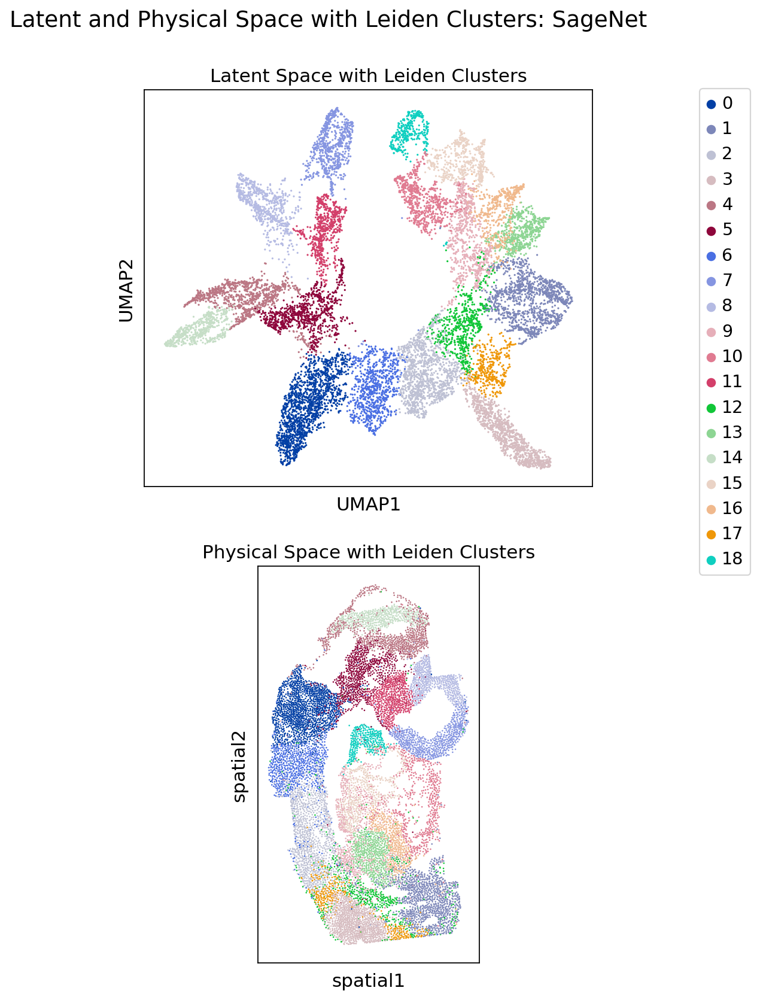

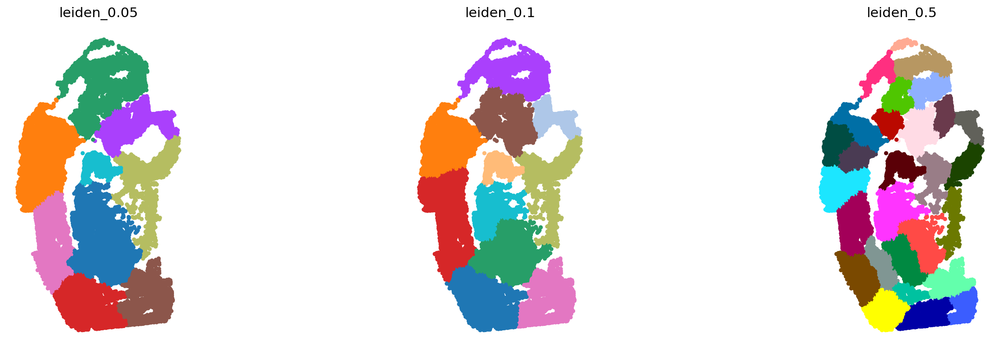

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


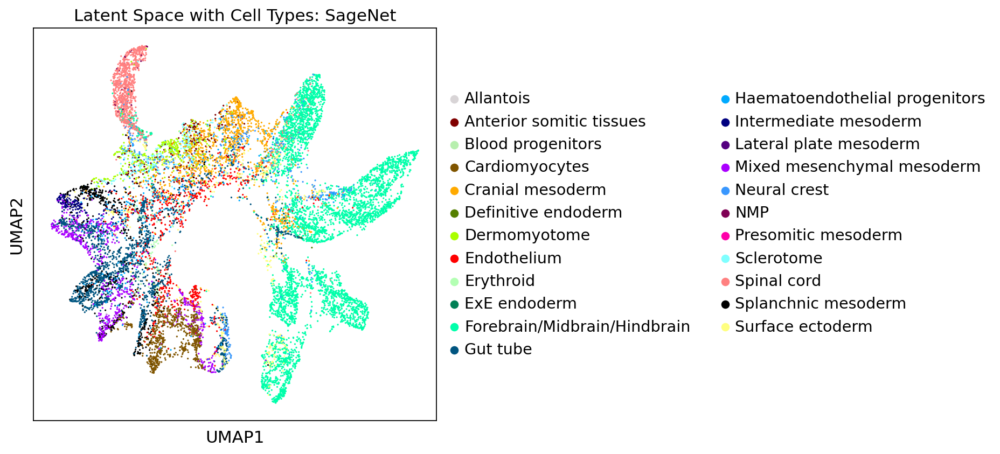

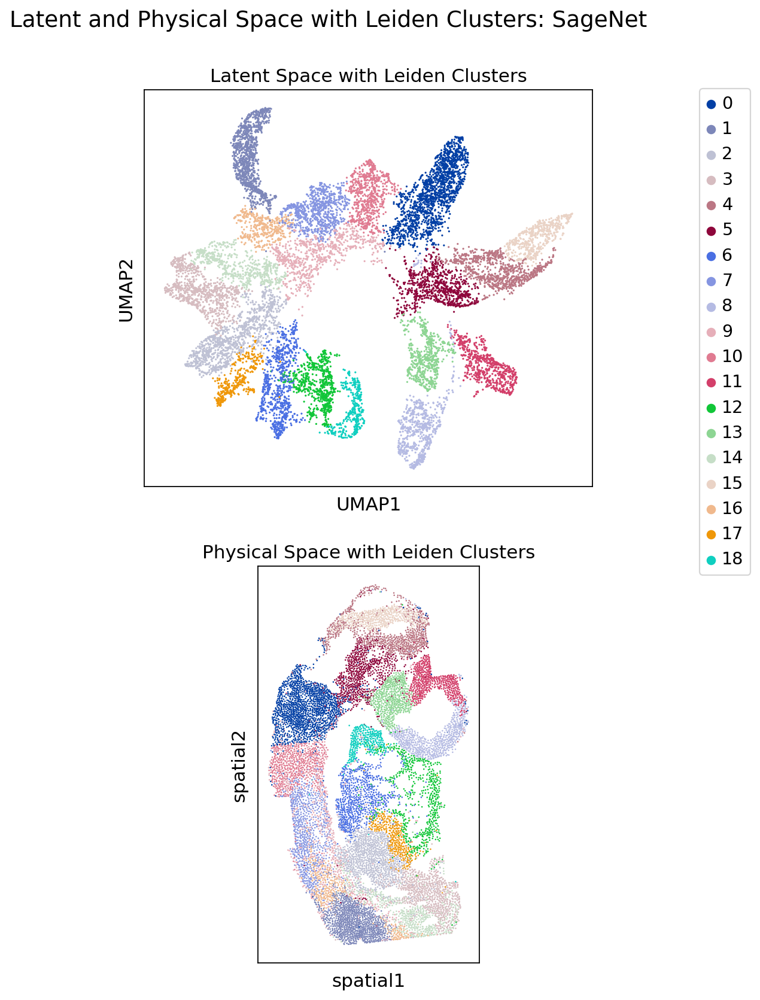

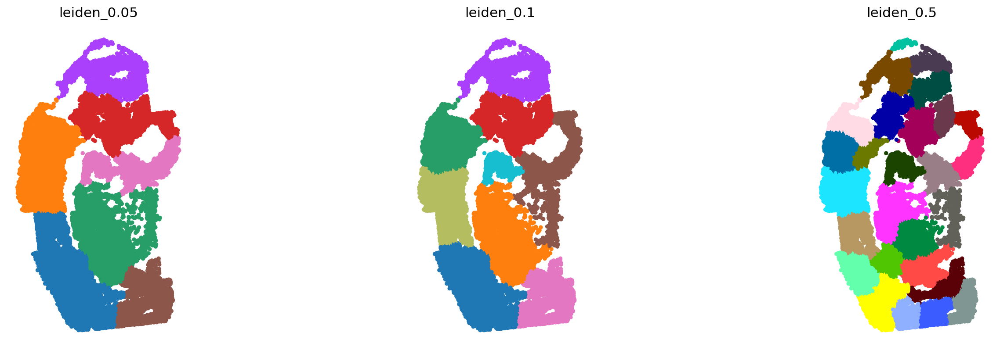

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


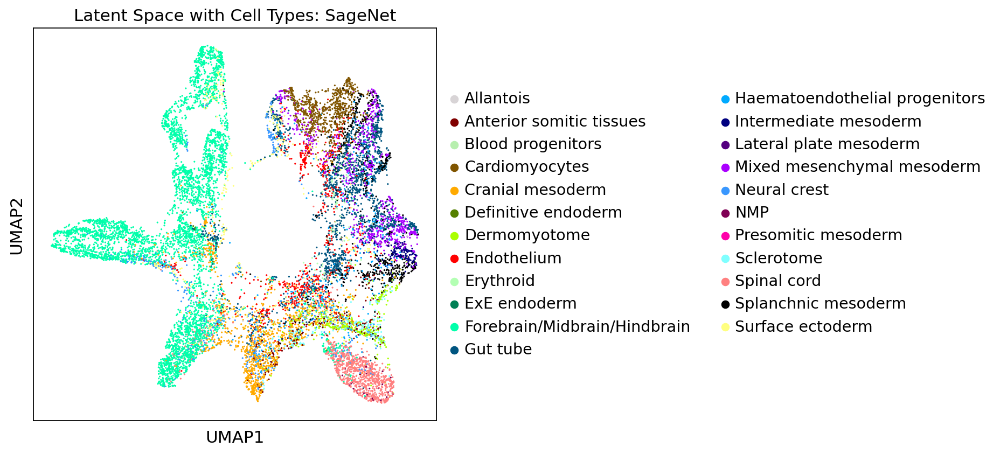

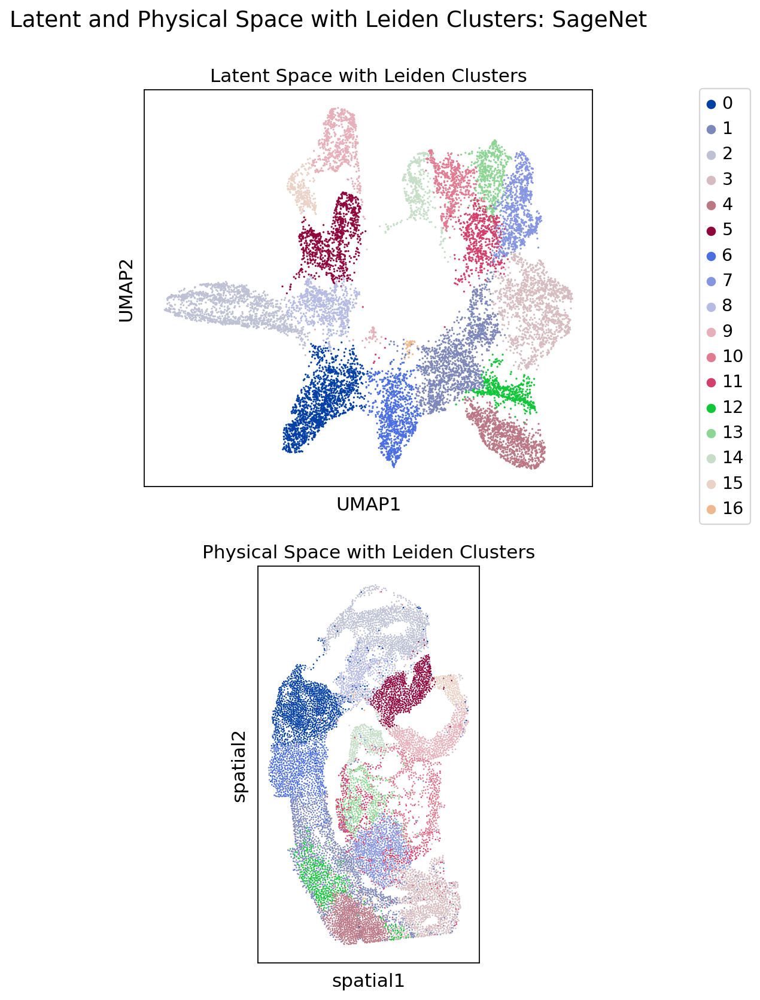

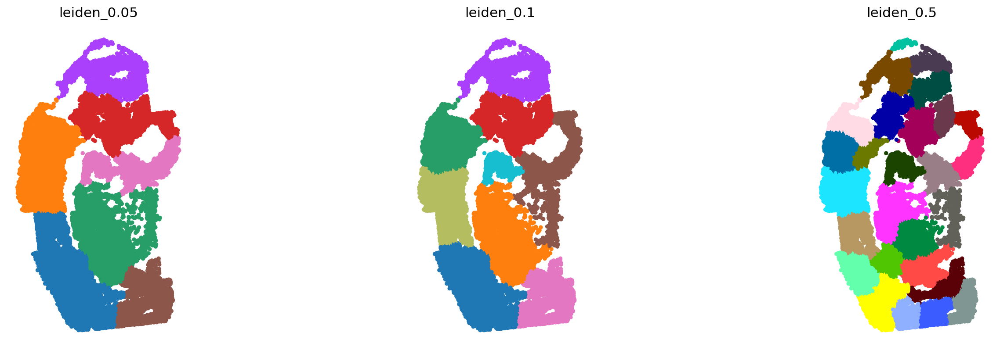

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


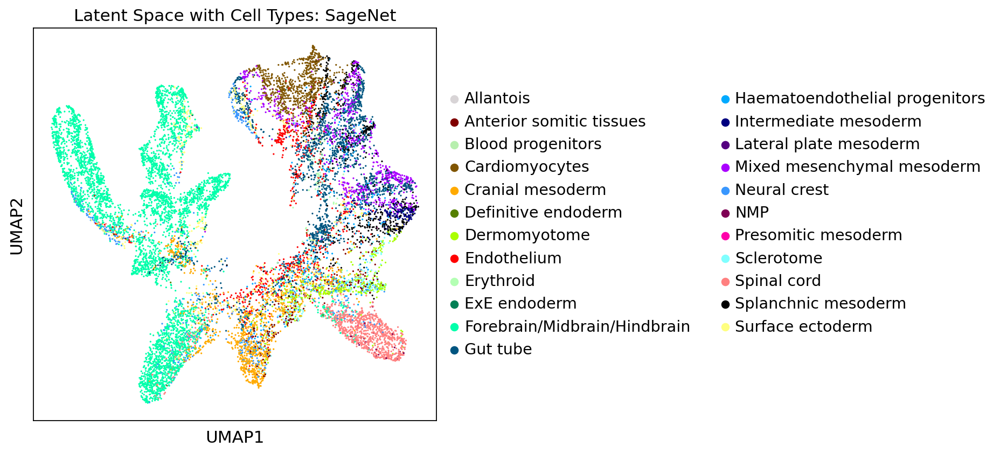

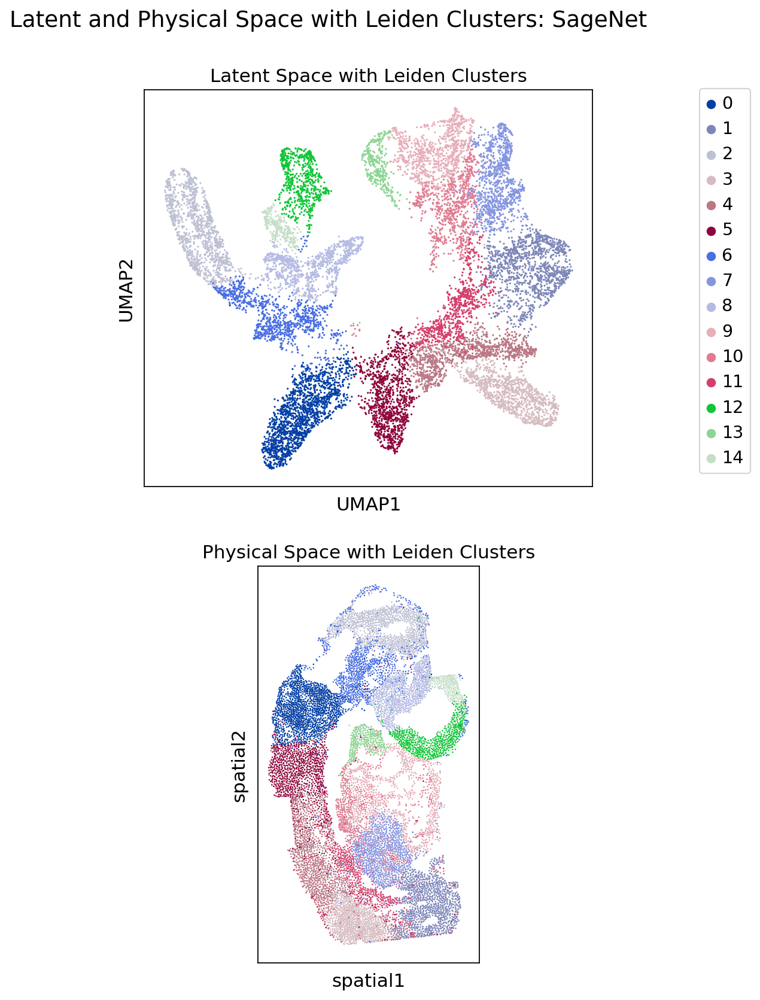

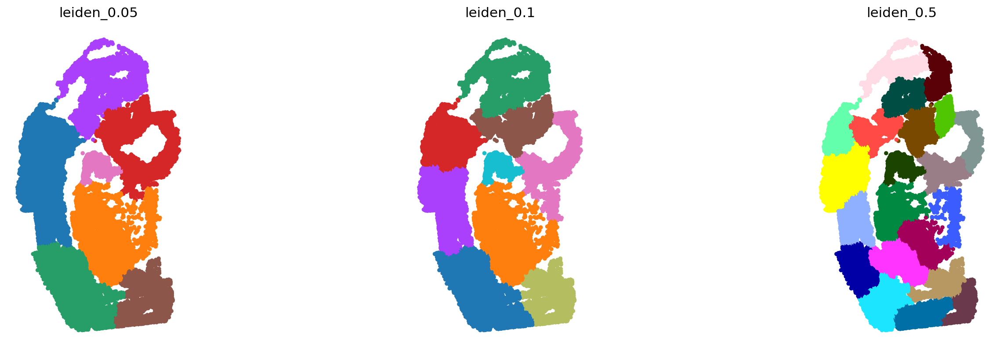

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


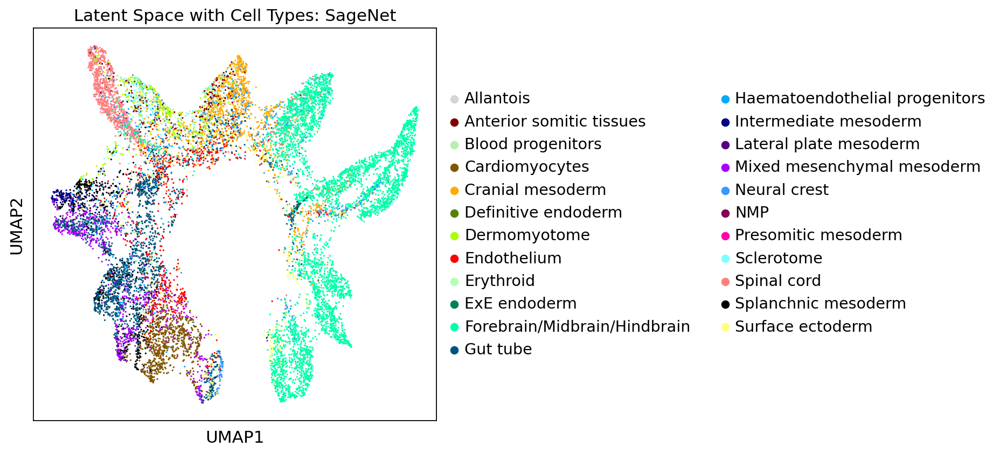

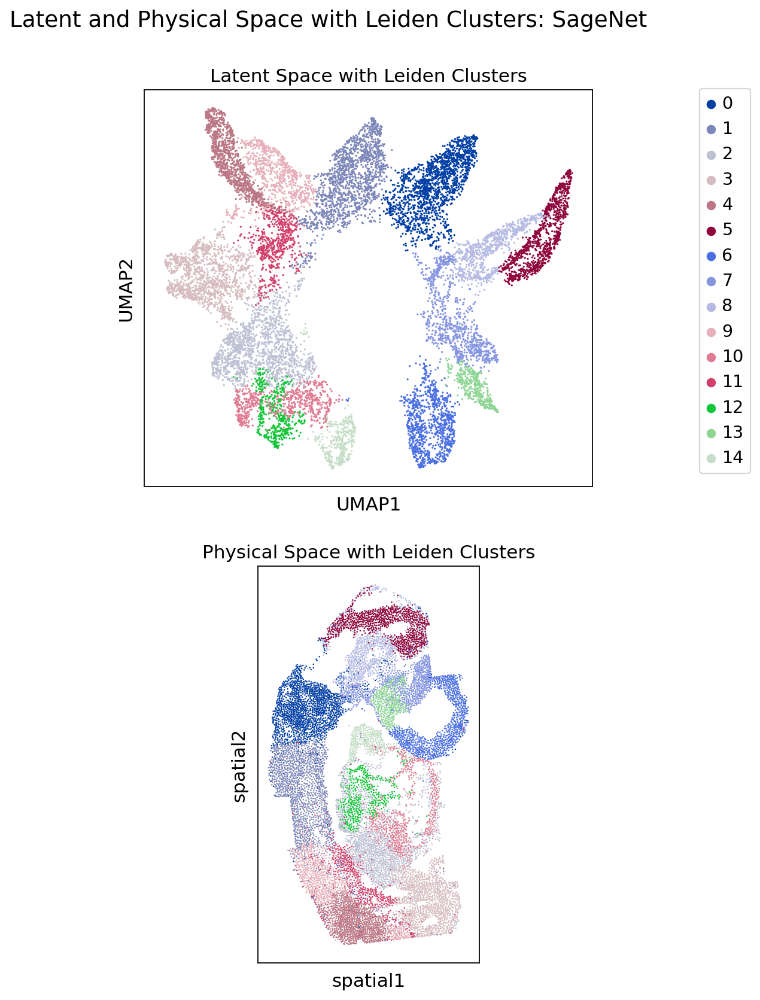

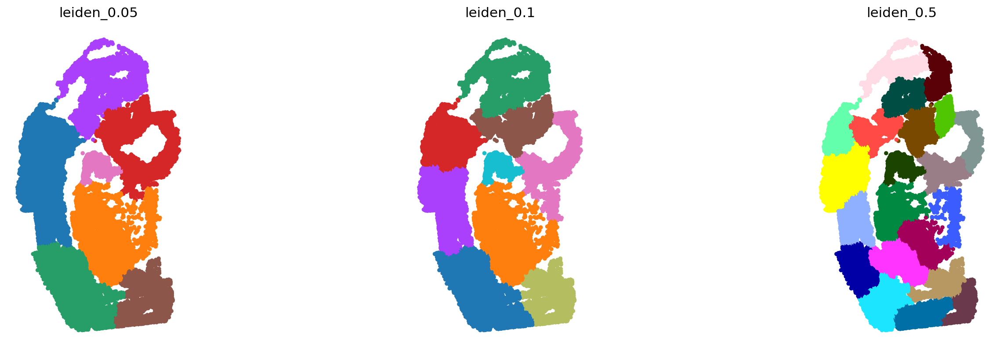

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


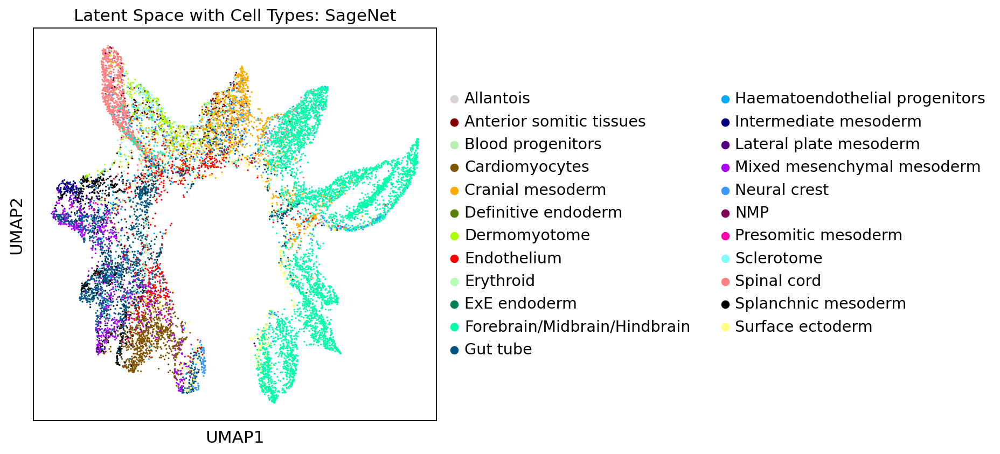

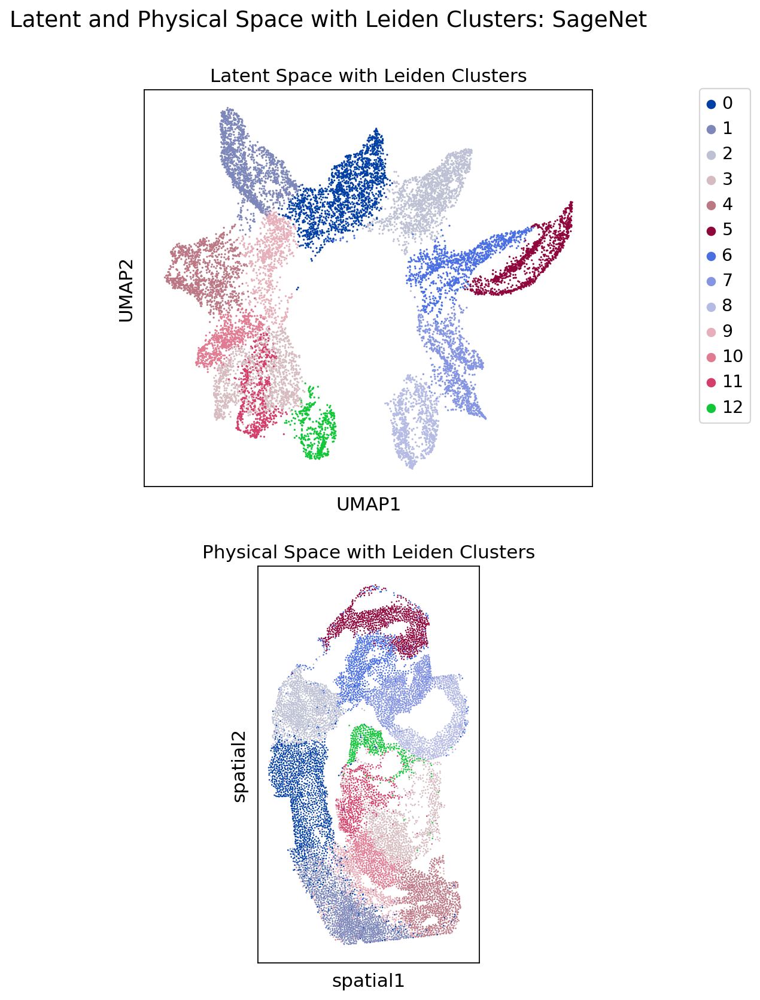

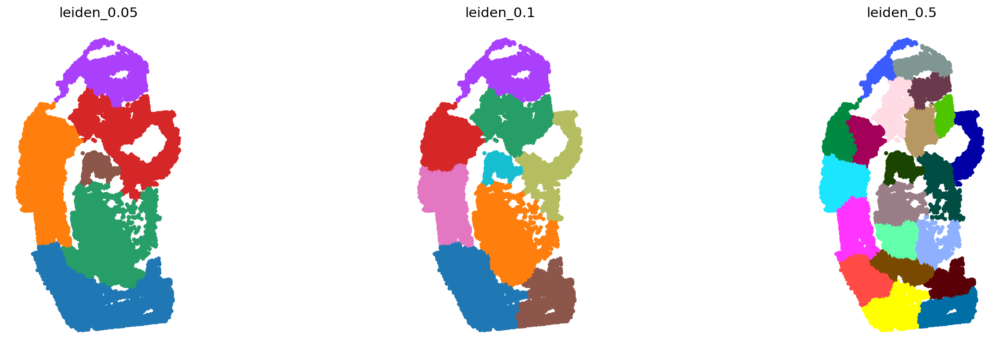

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


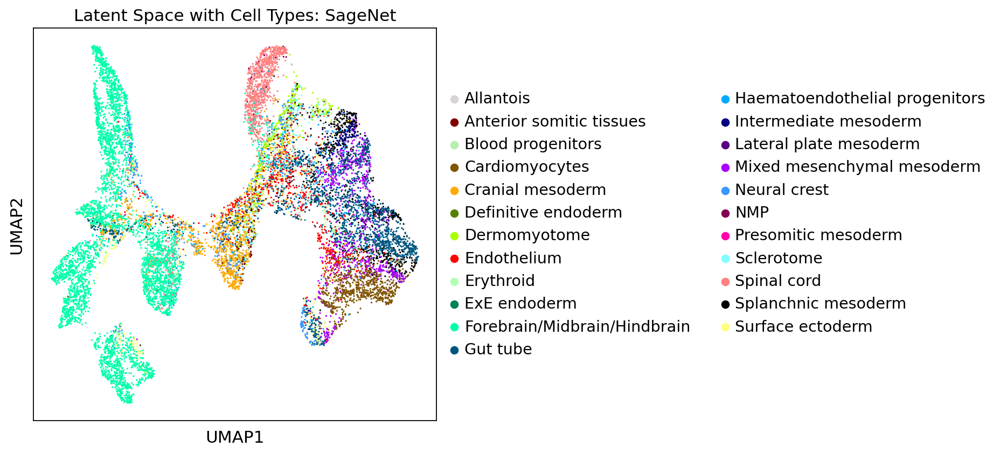

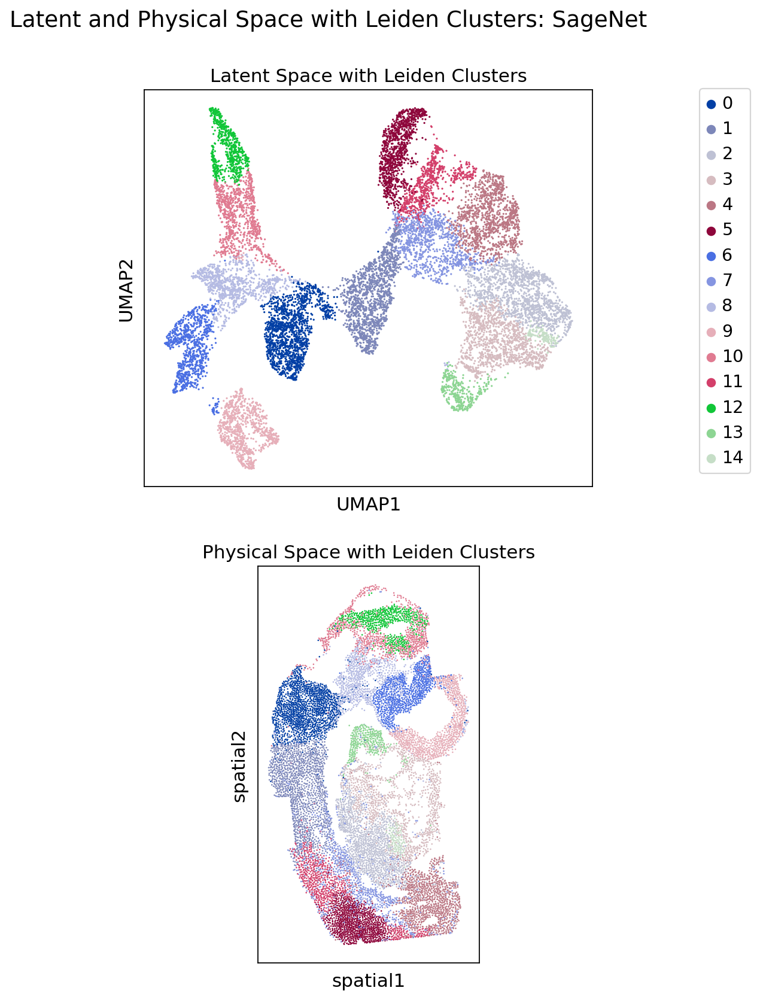

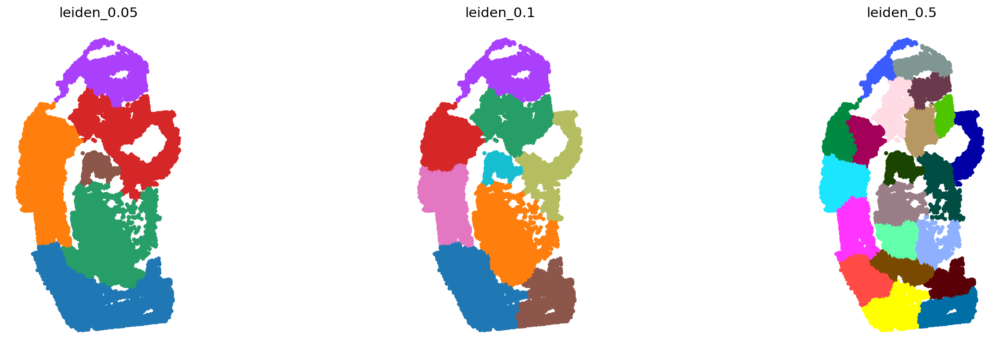

/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/torch_geometric/deprecation.py:12: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)
/home/cartalop/anaconda3/envs/sagenet/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


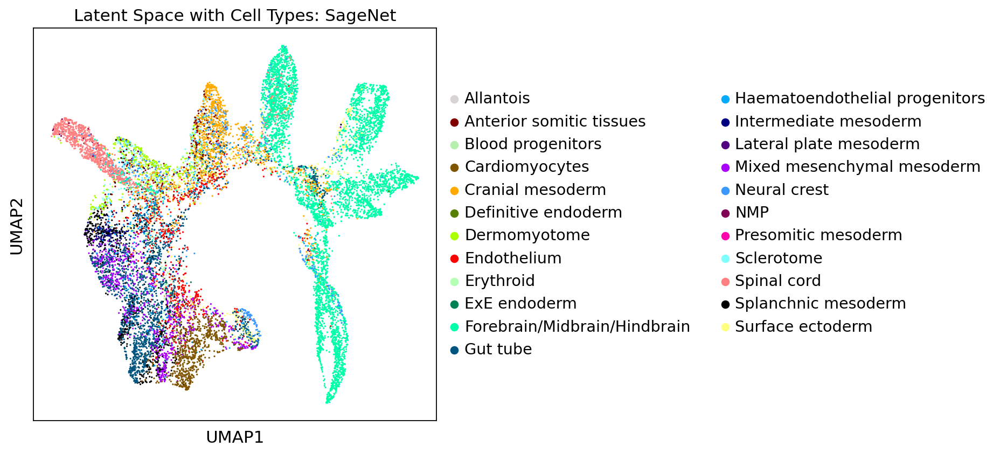

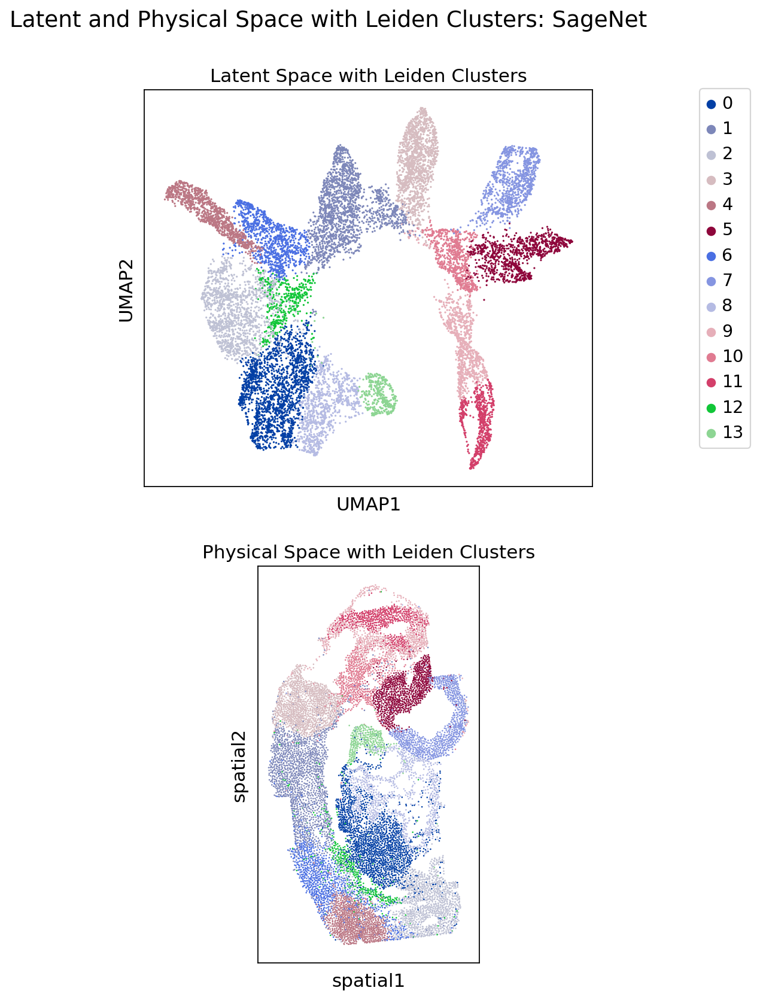

In [18]:
for run_number, n_neighbors in zip(np.arange(1,11), [4, 4, 8, 8, 12, 12, 16, 16, 20, 20]): # 2 runs per n_neighbors for a total of 10 runs
    # Compute spatial neighborhood graph for clustering
    sq.gr.spatial_neighbors(adata,
                            coord_type="generic",
                            spatial_key="spatial",
                            n_neighs=n_neighbors)
    
    # Estimate gene interaction network
    glasso(adata, [0.25, 0.5]) # the adjacency matrix of the built graph is added under 'adata.varm["adj"]'
    
    # Compute spatial partitoning with 3 different resolutions to capture different granularities
    sc.tl.leiden(adata,
                 resolution=.05,
                 random_state=random_seed,
                 key_added="leiden_0.05",
                 adjacency=adata.obsp["spatial_connectivities"]) # the partitioning is added under 'adata.obs["leiden_0.05"]'
    sc.tl.leiden(adata,
                 resolution=.1,
                 random_state=random_seed,
                 key_added="leiden_0.1",
                 adjacency=adata.obsp["spatial_connectivities"]) # the partitioning is added under 'adata.obs["leiden_0.1"]'
    sc.tl.leiden(adata,
                 resolution=.5,
                 random_state=random_seed,
                 key_added="leiden_0.5",
                 adjacency=adata.obsp["spatial_connectivities"]) # the partitioning is added under 'adata.obs["leiden_0.5"]'
    sc.pl.spatial(adata,
                  color=["leiden_0.05", "leiden_0.1", "leiden_0.5"],
                  frameon=False,
                  ncols=3,
                  spot_size=.1,
                  title=["leiden_0.05", "leiden_0.1", "leiden_0.5"],
                  legend_loc=None)
    
    # Define model object
    sg_obj = sca.models.sagenet(device=device)
    
    sg_obj.train(adata,
                 comm_columns=["leiden_0.05", "leiden_0.1", "leiden_0.5"],
                 tag="embryo2",
                 epochs=15,
                 verbose = False,
                 importance=True)
    
    sg_obj.load_query_data(adata)
    
    # Use SageNet cell-cell-distances for UMAP generation
    sc.pp.neighbors(adata, use_rep="dist_map", n_neighbors=n_neighbors)
    sc.tl.umap(adata, min_dist=0.3)
    fig = sc.pl.umap(adata,
                     color=[cell_type_key],
                     title="Latent Space with Cell Types: SageNet",
                     return_fig=True)
    fig.savefig(f"{figure_folder_path}/latent_sagenet_cell_types_run_{run_number}_{current_timestamp}.png",
                bbox_inches="tight")
    
    # Compute latent Leiden clustering
    sc.tl.leiden(adata=adata,
                 resolution=leiden_resolution,
                 random_state=random_seed,
                 key_added=f"latent_sagenet_leiden_{str(leiden_resolution)}")
    
    # Create subplot of latent Leiden cluster annotations in physical and latent space
    fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(6, 12))
    title = fig.suptitle(t="Latent and Physical Space with Leiden Clusters: SageNet")
    sc.pl.umap(adata=adata,
               color=[f"latent_sagenet_leiden_{str(leiden_resolution)}"],
               title=f"Latent Space with Leiden Clusters",
               ax=axs[0],
               show=False)
    sc.pl.spatial(adata=adata,
                  color=[f"latent_sagenet_leiden_{str(leiden_resolution)}"],
                  spot_size=0.03,
                  title=f"Physical Space with Leiden Clusters",
                  ax=axs[1],
                  show=False)

    # Create and position shared legend
    handles, labels = axs[0].get_legend_handles_labels()
    lgd = fig.legend(handles, labels, bbox_to_anchor=(1.25, 0.9185))
    axs[0].get_legend().remove()
    axs[1].get_legend().remove()

    # Adjust, save and display plot
    plt.subplots_adjust(wspace=0, hspace=0.2)
    fig.savefig(f"{figure_folder_path}/latent_physical_comparison_sagenet_leiden_run_{run_number}_{current_timestamp}.png",
                bbox_extra_artists=(lgd, title),
                bbox_inches="tight")
    plt.show()
    
    # Use UMAP embedding of cell-cell distances as latent features
    adata_original.obsm[latent_key + f"_run{run_number}"] = adata.obsm["X_umap"]
    
    # Label all 'gene programs' as active gene programs for subsequent benchmarking
    adata_original.uns[f"sagenet_active_gp_names_run{run_number}"] = (
        np.array([f"latent_{i}" for i in range(adata_original.obsm[f"sagenet_latent_run{run_number}"].shape[1])]))
    
    # Store intermediate adata to disk
    adata_original.write(f"{data_folder_path}/{dataset}_sagenet.h5ad")
    
# Add sample as observation
adata_original.obs["sample"] = "embryo2"
    
# Store final adata to disk
adata_original.write(f"{data_folder_path}/{dataset}_sagenet.h5ad")